In [1]:
!pip install mne matplotlib ipympl
!pip install ipympl

In [1]:
import mne
import pandas as pd
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt
from pprint import pprint  # imprimir de forma mais legível
%matplotlib widget

In [3]:
caminho_dados_raw = '/workspaces/EEG_Project/data/raw'

# Listar todos os ficheiros na pasta para confirmar
lista_de_ficheiros = os.listdir(caminho_dados_raw)

print(f"Encontrados {len(lista_de_ficheiros)} ficheiros na pasta:")
pprint(lista_de_ficheiros)

Encontrados 44 ficheiros na pasta:
['control_57.edf',
 'control_51.edf',
 'control_37.edf',
 'control_38.edf',
 'TEA_L_16.edf',
 'TEA_M_20.edf',
 'TEA_L_27.edf',
 'control_47.edf',
 'control_35.edf',
 'TEA_M_19.edf',
 'TEA_L_17.edf',
 'TEA_L_32.edf',
 'control_36.edf',
 'TEA_M_15.edf',
 'control_13.edf',
 'TEA_L_24.edf',
 'control_50.edf',
 'control_60.edf',
 'TEA_L_29.edf',
 'TEA_G_40.edf',
 'control_59.edf',
 'control_48.edf',
 'control_43.edf',
 'control_44.edf',
 'control_61.edf',
 'control_39.edf',
 'control_55.edf',
 'TEA_L_46.edf',
 'control_58.edf',
 'control_54.edf',
 'control_42.edf',
 'control_14-sem marcacoes.edf',
 'control_41.edf',
 'TEA_M_22_1.edf',
 'control_56.edf',
 'TEA_M_22.edf',
 'TEA_M_21.edf',
 'TEA_G_30.edf',
 'TEA_G_26.edf',
 'TEA_M_18.edf',
 'TEA_G_28.edf',
 'control_12.edf',
 'TEA_L_25.edf',
 'control_49.edf']


In [4]:
# Lista para guardar as informações de cada ficheiro
info_ficheiros = []

# Loop por cada nome de ficheiro encontrado na pasta
for nome_ficheiro in sorted(lista_de_ficheiros):
    # Verificar se o ficheiro é um .edf para ignorar outros ficheiros como .txt
    if nome_ficheiro.endswith('.edf'):
        caminho_completo = os.path.join(caminho_dados_raw, nome_ficheiro)
        
        try:
            # Tentar ler os metadados do ficheiro. 
            # preload=False (ler apenas o cabeçalho)
            raw = mne.io.read_raw_edf(caminho_completo, preload=False)
            
            # Se a leitura for bem-sucedida, extrair as informações
            info = {
                'ficheiro': nome_ficheiro,
                'status': 'Sucesso',
                'canais': len(raw.ch_names),
                'taxa_amostragem_hz': raw.info['sfreq'],
                'duracao_s': raw.n_times / raw.info['sfreq'],
                'erro': '-'
            }
            info_ficheiros.append(info)
            
        except Exception as e:
            # Se der erro na leitura, guardar o nome do ficheiro e a mensagem de erro
            info = {
                'ficheiro': nome_ficheiro,
                'status': 'Falha',
                'canais': '-',
                'taxa_amostragem_hz': '-',
                'duracao_s': '-',
                'erro': str(e) # Converte o erro para texto
            }
            info_ficheiros.append(info)

# Converter a lista de informações numa tabela do pandas para visualização
df_info = pd.DataFrame(info_ficheiros)

# Mostrar a tabela completa
df_info

Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_G_26.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_G_28.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_G_30.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_G_40.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_L_16.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_L_17.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_L_24.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_L_25.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_L_27.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_L_29.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_L_32.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_L_46.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_M_15.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_M_18.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_M_19.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_M_20.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_M_21.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_M_22.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_M_22_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_12.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_13.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_14-sem marcacoes.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_35.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_36.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_37.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_38.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_39.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_41.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_42.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_43.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_44.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_47.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_48.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_49.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_50.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_51.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_54.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_55.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_56.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_57.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_58.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_59.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_60.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_61.edf...
EDF file detected


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)
/tmp/ipykernel_19156/357258704.py:13: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(caminho_completo, preload=False)


,ficheiro,status,canais,taxa_amostragem_hz,duracao_s,erro
0,TEA_G_26.edf,Sucesso,43,200.0,2895.0,-
1,TEA_G_28.edf,Falha,-,-,-,Encountered invalid byte in at least one annot...
2,TEA_G_30.edf,Sucesso,43,200.0,3541.0,-
3,TEA_G_40.edf,Sucesso,43,200.0,2054.0,-
4,TEA_L_16.edf,Sucesso,43,200.0,3031.0,-
5,TEA_L_17.edf,Sucesso,43,200.0,3873.0,-
6,TEA_L_24.edf,Sucesso,43,200.0,4770.0,-
7,TEA_L_25.edf,Sucesso,43,200.0,2012.0,-
8,TEA_L_27.edf,Sucesso,43,200.0,1850.0,-
9,TEA_L_29.edf,Falha,-,-,-,Encountered invalid byte in at least one annot...


In [5]:
# Tentativa 01 (carregar um dos ficheiros que falhou - TEA_G_28.edf será o teste)
caminho_ficheiro_teste = '/workspaces/EEG_Project/data/raw/TEA_G_28.edf'

print(f"A tentar carregar o ficheiro problemático: {caminho_ficheiro_teste}")

try:
    # Parâmetro 'stim_channel=None' usado para o MNE não procurar um canal de eventos padrão.
    raw_teste = mne.io.read_raw_edf(caminho_ficheiro_teste, preload=True, stim_channel=None)
    
    print("\nSUCESSO! O ficheiro foi carregado.")
    print("Informações do ficheiro recuperado:")
    print(raw_teste.info)
    
except Exception as e:
    print(f"\nA tentativa falhou novamente. Erro: {e}")

A tentar carregar o ficheiro problemático: /workspaces/EEG_Project/data/raw/TEA_G_28.edf
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_G_28.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 456399  =      0.000 ...  2281.995 secs...

A tentativa falhou novamente. Erro: Encountered invalid byte in at least one annotations channel. You might want to try setting "encoding='latin1'".


In [6]:
# Tentativa 02 (especificando a codificação do texto)
caminho_ficheiro_teste = '/workspaces/EEG_Project/data/raw/TEA_G_28.edf'

print(f"A tentar carregar o ficheiro problemático (Tentativa 2): {caminho_ficheiro_teste}")

try:
   
    raw_teste = mne.io.read_raw_edf(
        caminho_ficheiro_teste,
        preload=True,
        stim_channel=None,
        encoding='latin1'  # mudança
    )
    
    print("\nSUCESSO! O ficheiro foi carregado.")
    print("Informações do ficheiro recuperado:")
    print(raw_teste.info)
    
except Exception as e:
    print(f"\nA tentativa falhou novamente. Erro: {e}")

A tentar carregar o ficheiro problemático (Tentativa 2): /workspaces/EEG_Project/data/raw/TEA_G_28.edf
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_G_28.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 456399  =      0.000 ...  2281.995 secs...

SUCESSO! O ficheiro foi carregado.
Informações do ficheiro recuperado:
<Info | 8 non-empty values
 bads: []
 ch_names: EEG Fp1-Ref, EEG Fp2-Ref, EEG F3-Ref, EEG F4-Ref, EEG C3-Ref, ...
 chs: 43 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 100.0 Hz
 meas_date: 2017-02-06 08:48:01 UTC
 nchan: 43
 projs: []
 sfreq: 200.0 Hz
 subject_info: 3 items (dict)
>


In [7]:
# CÉLULA 3 (Atualizada com a correção)
# Objetivo: Tentar carregar todos os ficheiros, aplicando a nova estratégia de recuperação

info_ficheiros_2 = []
caminho_dados_raw = '/workspaces/EEG_Project/data/raw'

print("A executar a exploração 2 em todos os ficheiros...")

# Lista ordenada para uma visualização mais fácil
lista_de_ficheiros = sorted(os.listdir(caminho_dados_raw))

for nome_ficheiro in lista_de_ficheiros:
    if nome_ficheiro.endswith('.edf'):
        caminho_completo = os.path.join(caminho_dados_raw, nome_ficheiro)
        
        try:
            # Mudança: Aplicar a solução testada para todos os ficheiros
            raw = mne.io.read_raw_edf(
                caminho_completo,
                preload=False,
                stim_channel=None,
                encoding='latin1'
            )
            
            info = {
                'ficheiro': nome_ficheiro,
                'status': 'Sucesso',
                'canais': len(raw.ch_names),
                'taxa_amostragem_hz': raw.info['sfreq'],
                'duracao_s': round(raw.n_times / raw.info['sfreq'], 2), # Arredondar para 2 casas decimais
                'erro': '-'
            }
            info_ficheiros_2.append(info)
            
        except Exception as e:
            info = {
                'ficheiro': nome_ficheiro,
                'status': 'Falha',
                'canais': '-',
                'taxa_amostragem_hz': '-',
                'duracao_s': '-',
                'erro': str(e)
            }
            info_ficheiros_v.append(info)

# Criando um novo DataFrame com os resultados atualizados
df_info_2 = pd.DataFrame(info_ficheiros_2)

print("Exploração V2 concluída.")

# Mostrar a nova tabela
df_info_2

A executar a exploração 2 em todos os ficheiros...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_G_26.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_G_28.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_G_30.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_G_40.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_L_16.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_L_17.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_L_24.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_L_25.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_L_27.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_L_29.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_L_32.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_L_46.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_M_15.edf...
EDF file detected


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_M_18.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_M_19.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_M_20.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_M_21.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_M_22.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_M_22_1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_12.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_13.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_14-sem marcacoes.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_35.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_36.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_37.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_38.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_39.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_41.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_42.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_43.edf...
EDF file detected


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_44.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_47.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_48.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_49.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_50.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_51.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_54.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_55.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_56.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_57.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_58.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_59.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_60.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_61.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2659519287.py:18: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Exploração V2 concluída.


,ficheiro,status,canais,taxa_amostragem_hz,duracao_s,erro
0,TEA_G_26.edf,Sucesso,43,200.0,2895.0,-
1,TEA_G_28.edf,Sucesso,43,200.0,2282.0,-
2,TEA_G_30.edf,Sucesso,43,200.0,3541.0,-
3,TEA_G_40.edf,Sucesso,43,200.0,2054.0,-
4,TEA_L_16.edf,Sucesso,43,200.0,3031.0,-
5,TEA_L_17.edf,Sucesso,43,200.0,3873.0,-
6,TEA_L_24.edf,Sucesso,43,200.0,4770.0,-
7,TEA_L_25.edf,Sucesso,43,200.0,2012.0,-
8,TEA_L_27.edf,Sucesso,43,200.0,1850.0,-
9,TEA_L_29.edf,Sucesso,43,200.0,1873.0,-


In [8]:
# Célula de Diagnóstico: confere os nomes exatos dos canais a serem usados
print(raw.ch_names)

['EEG Fp1-Ref', 'EEG Fp2-Ref', 'EEG F3-Ref', 'EEG F4-Ref', 'EEG C3-Ref', 'EEG C4-Ref', 'EEG P3-Ref', 'EEG P4-Ref', 'EEG O1-Ref', 'EEG O2-Ref', 'EEG F7-Ref', 'EEG F8-Ref', 'EEG T3-Ref', 'EEG T4-Ref', 'EEG T5-Ref', 'EEG T6-Ref', 'EEG Fz-Ref', 'EEG Cz-Ref', 'EEG Pz-Ref', 'POL E', 'POL PG1', 'POL PG2', 'EEG A1-Ref', 'EEG A2-Ref', 'POL T1', 'POL T2', 'POL X1', 'POL X2', 'POL X3', 'POL X4', 'POL X5', 'POL X6', 'POL X7', 'POL SpO2', 'POL EtCO2', 'POL DC03', 'POL DC04', 'POL DC05', 'POL DC06', 'POL Pulse', 'POL CO2Wave', 'POL $A1', 'POL $A2']


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_G_26.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 578999  =      0.000 ...  2894.995 secs...


/tmp/ipykernel_19156/2532321962.py:7: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw_amostra = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2532321962.py:7: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw_amostra = mne.io.read_raw_edf(


Limpeza final: 21 canais de EEG selecionados.

A renomear os canais para o formato padrão...
Canais renomeados com sucesso. Novos nomes: ['Fp1', 'Fp2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 'T3', 'T4', 'T5', 'T6', 'Fz', 'Cz', 'Pz', 'A1', 'A2']

A aplicar o mapa de elétrodos (montage) 10-20 padrão...

A gerar o gráfico dos sinais no tempo...
Using matplotlib as 2D backend.


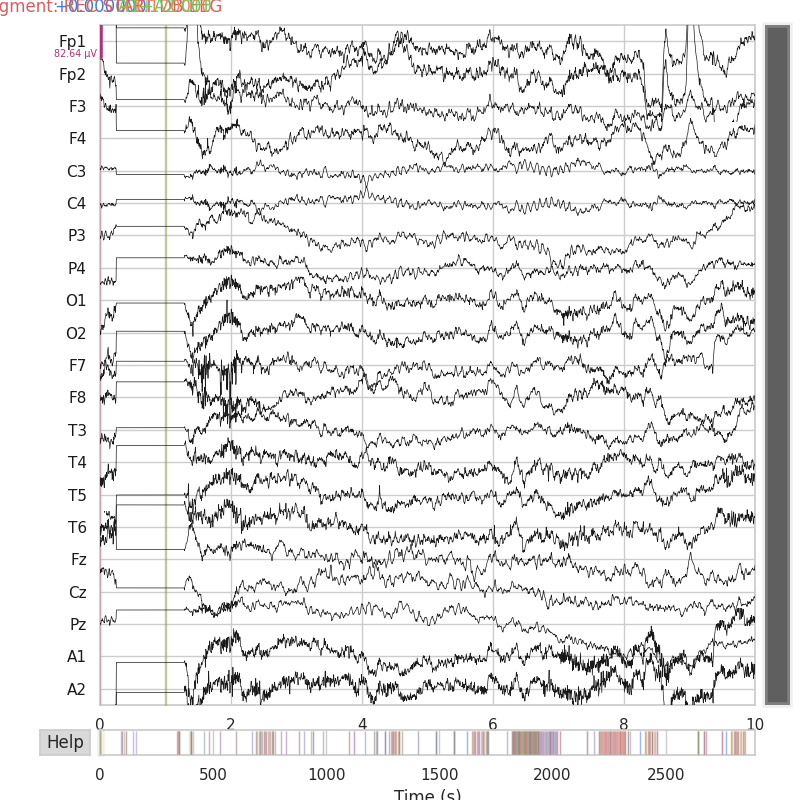


A gerar o gráfico PSD...
Effective window size : 10.240 (s)


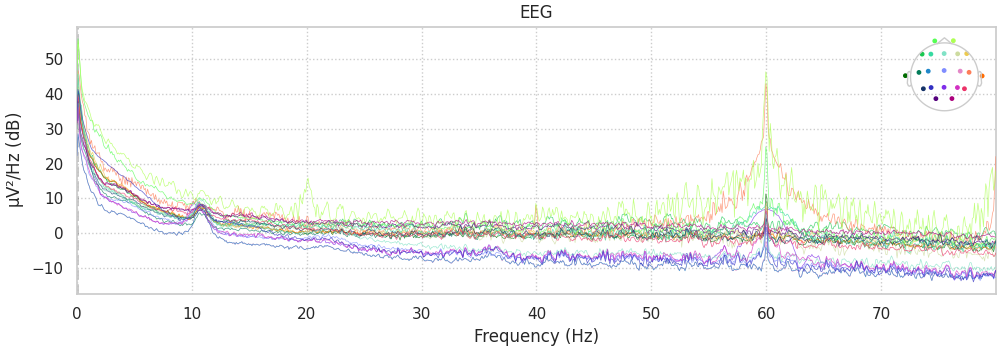

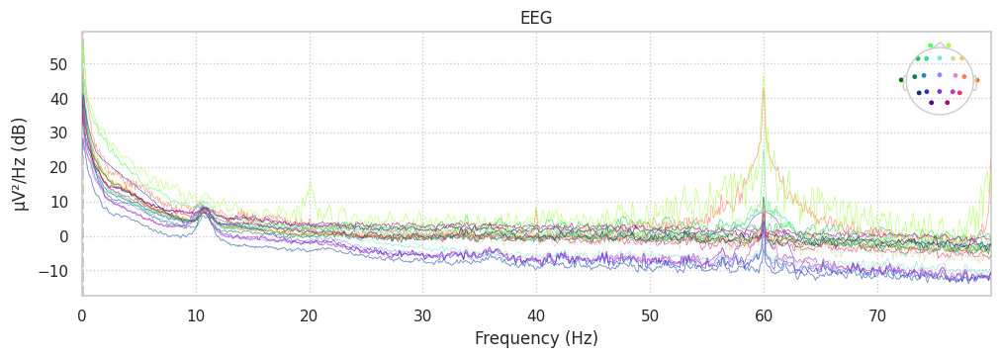

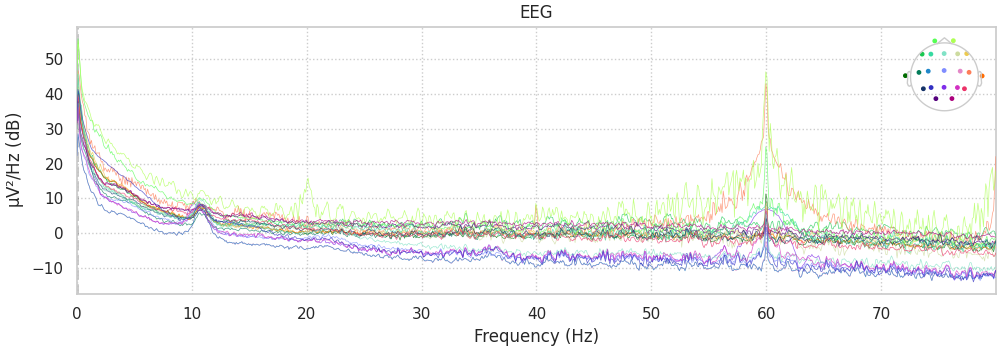

In [9]:
# Limpeza e Pré-processamento (parte 1: inspeção visual)

caminho_ficheiro_visual = '/workspaces/EEG_Project/data/raw/TEA_G_26.edf' # Primeiro ficheiro da lista para teste TEA_G_26.edf

sns.set_theme(style='whitegrid', palette='muted', rc={"figure.dpi": 100}) # Aplicar um tema visual

raw_amostra = mne.io.read_raw_edf(
    caminho_ficheiro_visual,
    preload=True,
    stim_channel=None,
    encoding='latin1'
)

# 2. Limpeza dos canais
# Agora que temos a lista, a regra de limpeza mais segura é manter apenas os canais que começam com 'EEG'
todos_os_canais = raw_amostra.ch_names
canais_eeg_limpos = [nome for nome in todos_os_canais if nome.startswith('EEG')]
raw_eeg_apenas = raw_amostra.copy().pick(canais_eeg_limpos)
print(f"Limpeza final: {len(raw_eeg_apenas.ch_names)} canais de EEG selecionados.")

# 3. Renomear os canais para o padrão 10-20
print("\nA renomear os canais para o formato padrão...")
# Cria um dicionário de mapeamento: {'Nome Antigo': 'Nome Novo'}
mapeamento_nomes = {nome: nome.replace('EEG ', '').replace('-Ref', '') for nome in raw_eeg_apenas.ch_names}
# Aplicando a renomeação
raw_eeg_apenas.rename_channels(mapeamento_nomes)
print("Canais renomeados com sucesso. Novos nomes:", raw_eeg_apenas.ch_names)

# 4. Add informação de localização (montagem)
print("\nA aplicar o mapa de elétrodos (montage) 10-20 padrão...")
montage = mne.channels.make_standard_montage('standard_1020')
raw_eeg_apenas.set_montage(montage, on_missing='warn') 
         
# 4. Gráficos
# Gráfico dos sinais de EEG no tempo
print("\nA gerar o gráfico dos sinais no tempo...")
raw_eeg_apenas.plot(duration=10, n_channels=len(raw_eeg_apenas.ch_names), scalings='auto', title=f"Sinais EEG: {os.path.basename(caminho_ficheiro_visual)}")

# Gráfico da Densidade de Potência Espectral (PSD)
print("\nA gerar o gráfico PSD...")
raw_eeg_apenas.compute_psd(fmin=0, fmax=80).plot()

A aplicar filtros aos dados de EEG...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 661 samples (3.305 s)

Filtro Passa-Banda (1-40 Hz) aplicado.
Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 59.35
- Lower transitio

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done  21 out of  21 | elapsed:    0.4s finished


Filtro Notch (60 Hz) aplicado.

Gerando gráfico PSD dos dados filtrados...
Effective window size : 10.240 (s)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  21 out of  21 | elapsed:    0.3s finished


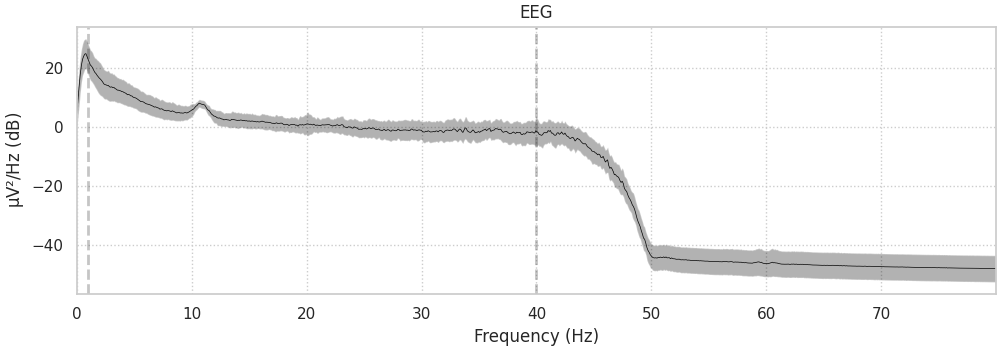

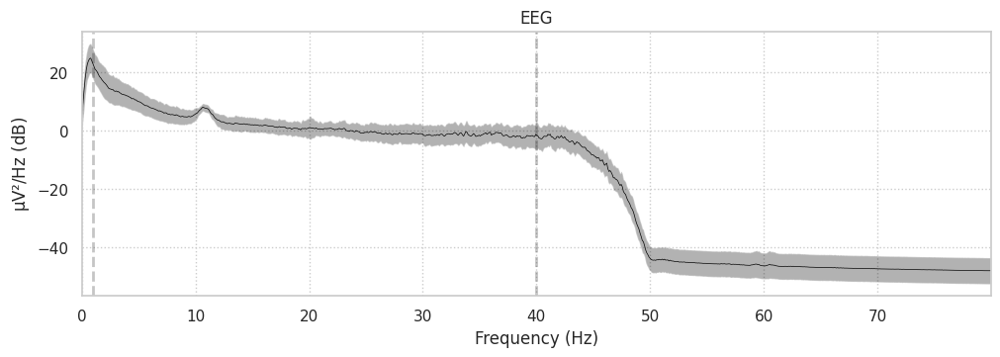

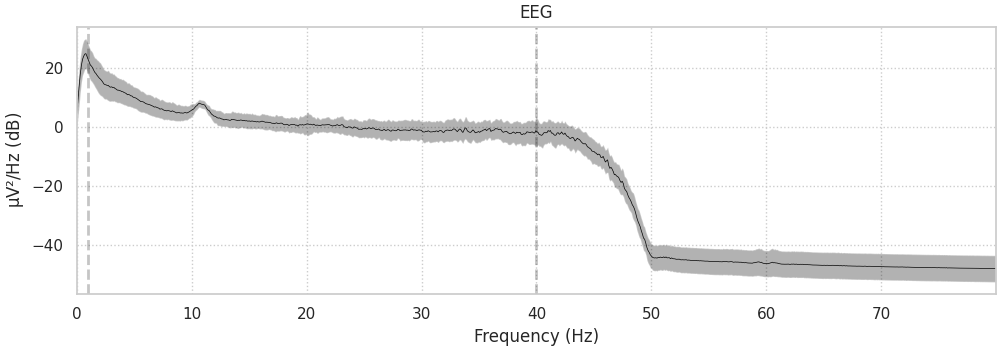

In [10]:
# Limpeza e Pré-processamento (parte 2: Filtragem do Sinal)

print("A aplicar filtros aos dados de EEG...")

# Band-pass filter (1-40Hz) | removendo desvios lentos e ruído muscular.
l_freq = 1.0  # Frequência de corte inferior (Hz)
h_freq = 40.0 # Frequência de corte superior (Hz)
raw_filtrado = raw_eeg_apenas.copy().filter(l_freq=l_freq, h_freq=h_freq)
print(f"Filtro Passa-Banda (1-40 Hz) aplicado.")

# Filtro Notch (60Hz identificado na primeira visualização dos dados)
freqs_notch = (60.0) 
raw_filtrado.notch_filter(freqs=freqs_notch)
print(f"Filtro Notch (60 Hz) aplicado.")

# Verificação e visualização Pós-Filtros
print("\nGerando gráfico PSD dos dados filtrados...")

raw_filtrado.compute_psd(fmin=0, fmax=80).plot(average=True)

A aplicar os filtros aos dados de EEG...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 661 samples (3.305 s)

Filtro Passa-Banda (1-40 Hz) aplicado.
Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 59.35
- Lower transi

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done  21 out of  21 | elapsed:    0.3s finished


Filtro Notch (60 Hz) aplicado.

Gerando gráfico PSD dos dados filtrados...
Effective window size : 10.240 (s)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  21 out of  21 | elapsed:    0.2s finished


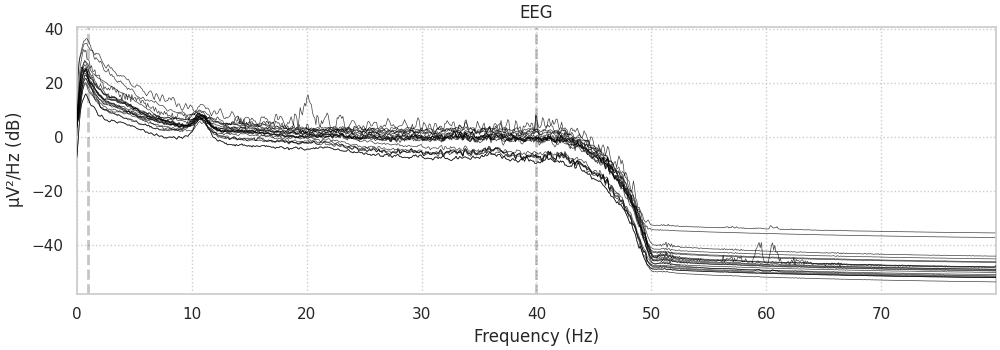

Text(0.5, 0.98, 'PSD Pós-Filtragem')

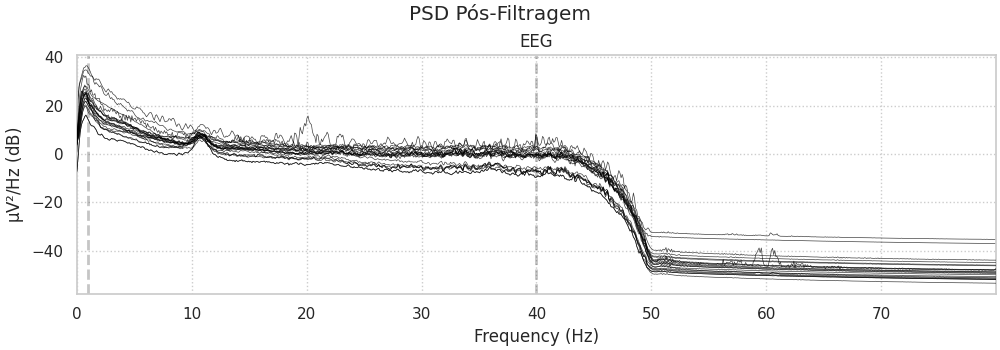

In [11]:
# Repetindo o Processo com outra visualização
# Objetivo: verificar se algum canal indivídual se comporta atipicamente

# Filtros
print("A aplicar os filtros aos dados de EEG...")
raw_filtrado = raw_eeg_apenas.copy().filter(l_freq=1.0, h_freq=40.0)
print(f"Filtro Passa-Banda (1-40 Hz) aplicado.")
raw_filtrado.notch_filter(freqs=60.0)
print(f"Filtro Notch (60 Hz) aplicado.")

# Visualização
print("\nGerando gráfico PSD dos dados filtrados...")

spectrum = raw_filtrado.compute_psd(fmin=0, fmax=80)
# Plot modificado
fig = spectrum.plot(
    average=False,         # False para mostrar a linha de cada canal
    spatial_colors=False,  # Desliga a separação por região
    show=True              # True para mostrar o gráfico
)
fig.suptitle("PSD Pós-Filtragem")

Analisando o participante: control_12.edf
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_12.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 467999  =      0.000 ...  2339.995 secs...


<>:44: SyntaxWarning: invalid escape sequence '\m'
<>:44: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_19156/2843176841.py:44: SyntaxWarning: invalid escape sequence '\m'
  ax.set_ylabel("Potência ($\mu V^2$/Hz)")
/tmp/ipykernel_19156/2843176841.py:9: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw_amostra = mne.io.read_raw_edf(
/tmp/ipykernel_19156/2843176841.py:9: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw_amostra = mne.io.read_raw_edf(


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 661 samples (3.305 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 59.35
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 59.10 Hz)
- Upper passband edge

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done  21 out of  21 | elapsed:    0.4s finished



Filtros (1-40 Hz e Notch 60 Hz) aplicados.

Gerando gráfico PSD médio Pós-Filtragem...
Effective window size : 10.240 (s)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  21 out of  21 | elapsed:    0.2s finished


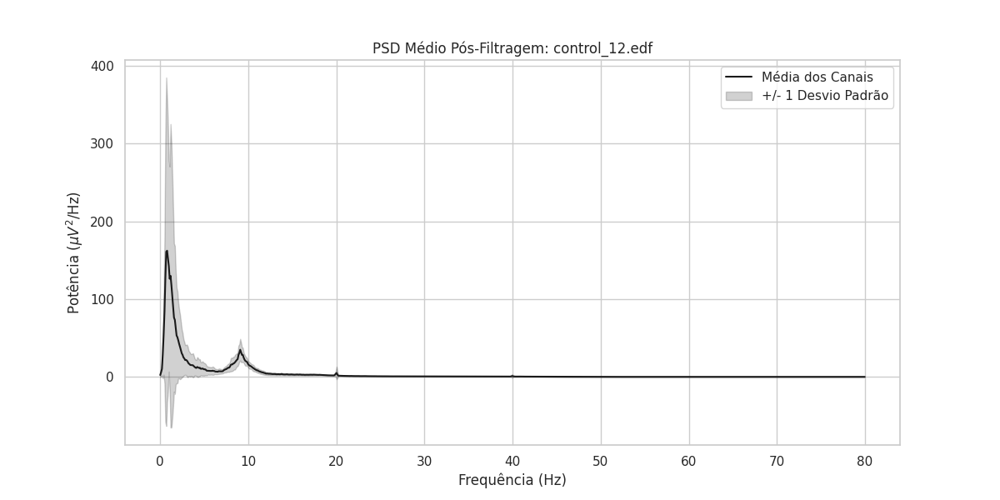

In [12]:
# Análise Comparativa (Grupo Controle)

sns.set_theme(style='whitegrid', palette='muted', rc={"figure.dpi": 100}) # layout (tema visual)

caminho_ficheiro = '/workspaces/EEG_Project/data/raw/control_12.edf' 

print(f"Analisando o participante: {os.path.basename(caminho_ficheiro)}")

raw_amostra = mne.io.read_raw_edf(
    caminho_ficheiro,
    preload=True,
    stim_channel=None,
    encoding='latin1'
)

# Limpar e renomear os canais
canais_eeg_limpos = [nome for nome in raw_amostra.ch_names if nome.startswith('EEG')]
raw_eeg_apenas = raw_amostra.copy().pick(canais_eeg_limpos)
mapeamento_nomes = {nome: nome.replace('EEG ', '').replace('-Ref', '') for nome in raw_eeg_apenas.ch_names}
raw_eeg_apenas.rename_channels(mapeamento_nomes)

montage = mne.channels.make_standard_montage('standard_1020')
raw_eeg_apenas.set_montage(montage, on_missing='warn')

# Aplicação do Filtro
raw_filtrado = raw_eeg_apenas.copy().filter(l_freq=1.0, h_freq=40.0)
raw_filtrado.notch_filter(freqs=60.0)
print("\nFiltros (1-40 Hz e Notch 60 Hz) aplicados.")

# Visualização
print("\nGerando gráfico PSD médio Pós-Filtragem...")

fig, ax = plt.subplots(figsize=(12, 6))
spectrum = raw_filtrado.compute_psd(fmin=0, fmax=80)
psds, freqs = spectrum.get_data(return_freqs=True)
psds = psds * (1e6**2) 
psds_mean = np.mean(psds, axis=0)
psds_std = np.std(psds, axis=0)

ax.plot(freqs, psds_mean, color='k', label='Média dos Canais')
ax.fill_between(freqs, psds_mean - psds_std, psds_mean + psds_std, color='k', alpha=0.2, label='+/- 1 Desvio Padrão')
ax.set_title(f"PSD Médio Pós-Filtragem: {os.path.basename(caminho_ficheiro)}")
ax.set_xlabel("Frequência (Hz)")
ax.set_ylabel("Potência ($\mu V^2$/Hz)")
ax.legend()
plt.show()

A carregar e a visualizar os dados brutos do participante 'control_12'...


Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_12.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 467999  =      0.000 ...  2339.995 secs...


/tmp/ipykernel_6948/83330958.py:6: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw_problema = mne.io.read_raw_edf(
/tmp/ipykernel_6948/83330958.py:6: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw_problema = mne.io.read_raw_edf(


Using matplotlib as 2D backend.


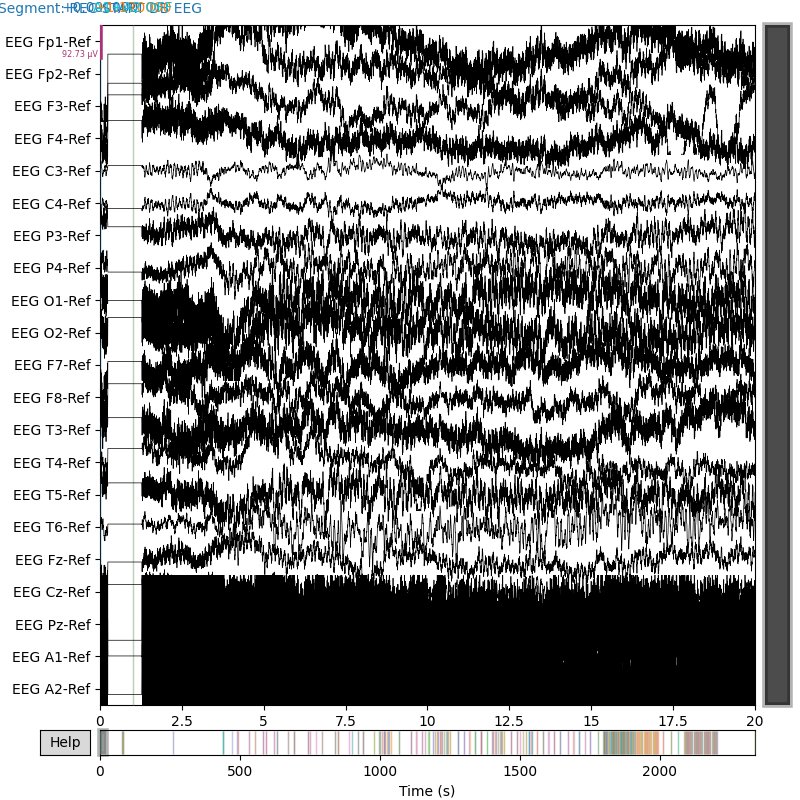

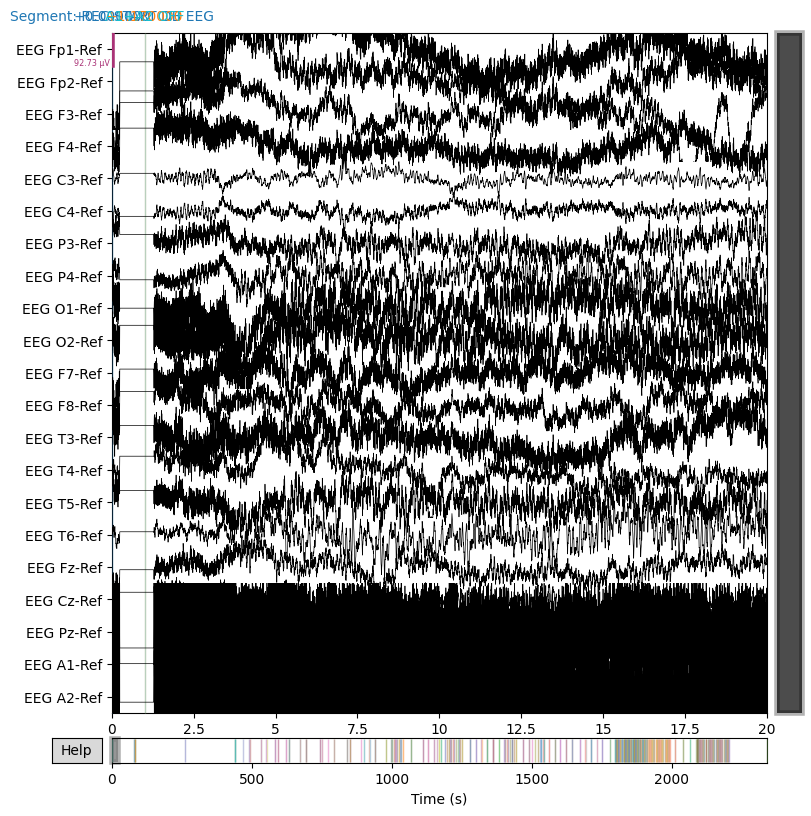

In [2]:
# Diagnóstico - Inspecionar Sinal Bruto do control_12.edf ---
print("A carregar e a visualizar os dados brutos do participante 'control_12'...")

# Carregar o ficheiro
caminho_ficheiro_problema = '/workspaces/EEG_Project/data/raw/control_12.edf' 
raw_problema = mne.io.read_raw_edf(
    caminho_ficheiro_problema,
    preload=True,
    stim_channel=None,
    encoding='latin1'
)

# Limpar canais não-EEG para melhor visualização
canais_eeg_limpos = [nome for nome in raw_problema.ch_names if nome.startswith('EEG')]
raw_problema_limpo = raw_problema.copy().pick(canais_eeg_limpos)

# Gerar o gráfico dos sinais no tempo para verificar a origem do problema
raw_problema_limpo.plot(duration=20, n_channels=len(raw_problema_limpo.ch_names), scalings='auto')

In [4]:
# Ferramenta de Controle de Qualidade
# Definição da função de inspeção visual

def inspecionar_participante(nome_do_ficheiro):
    """
    Esta função carrega, limpa e plota os dados brutos de um participante.
    """
    
    caminho_completo = f'/workspaces/EEG_Project/data/raw/{nome_do_ficheiro}'
    print(f"--- A inspecionar: {nome_do_ficheiro} ---")
    
    try:
        # Tenta carregar o ficheiro com a estratégia de recuperação
        raw = mne.io.read_raw_edf(
            caminho_completo,
            preload=True,
            stim_channel=None,
            encoding='latin1'
        )

        # Limpa os canais não-EEG
        canais_eeg = [ch for ch in raw.ch_names if ch.startswith('EEG')]
        raw_limpo = raw.copy().pick(canais_eeg)

        # Plota o sinal para inspeção visual
        raw_limpo.plot(duration=20, n_channels=len(raw_limpo.ch_names), scalings='auto', title=nome_do_ficheiro)
        
    except Exception as e:
        print(f"\n!!!!!! ERRO AO CARREGAR O FICHEIRO: {nome_do_ficheiro} !!!!!!")
        print(f"Detalhe do erro: {e}")

--- A inspecionar: control_13.edf ---
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_13.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 417799  =      0.000 ...  2088.995 secs...


/tmp/ipykernel_19156/3587602839.py:14: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/3587602839.py:14: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


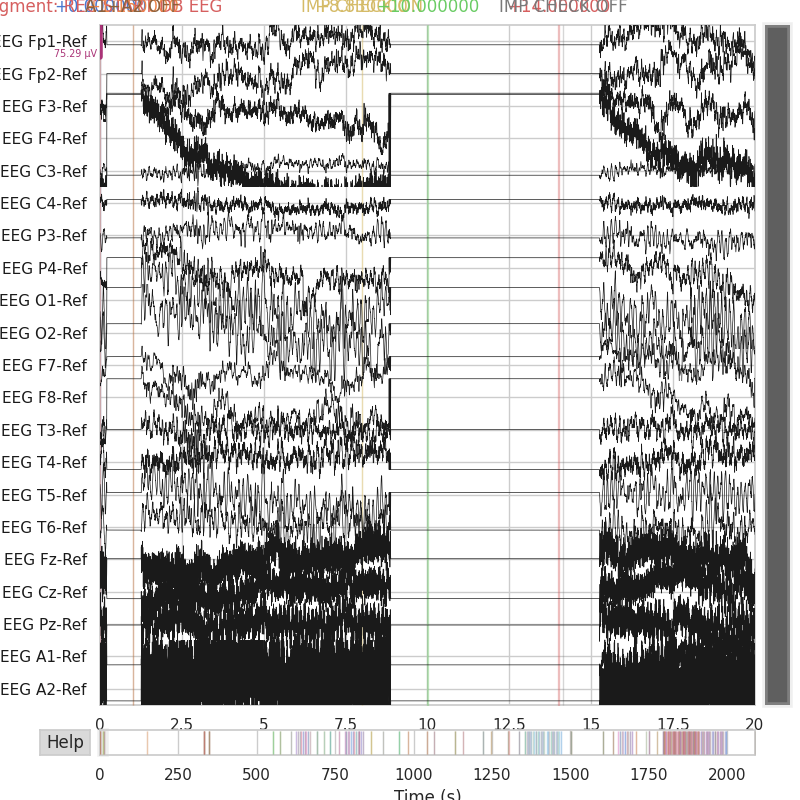

In [15]:
inspecionar_participante('control_13.edf')

--- A inspecionar: control_14-sem marcacoes.edf ---
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_14-sem marcacoes.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 650399  =      0.000 ...  3251.995 secs...


/tmp/ipykernel_19156/3587602839.py:14: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_19156/3587602839.py:14: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


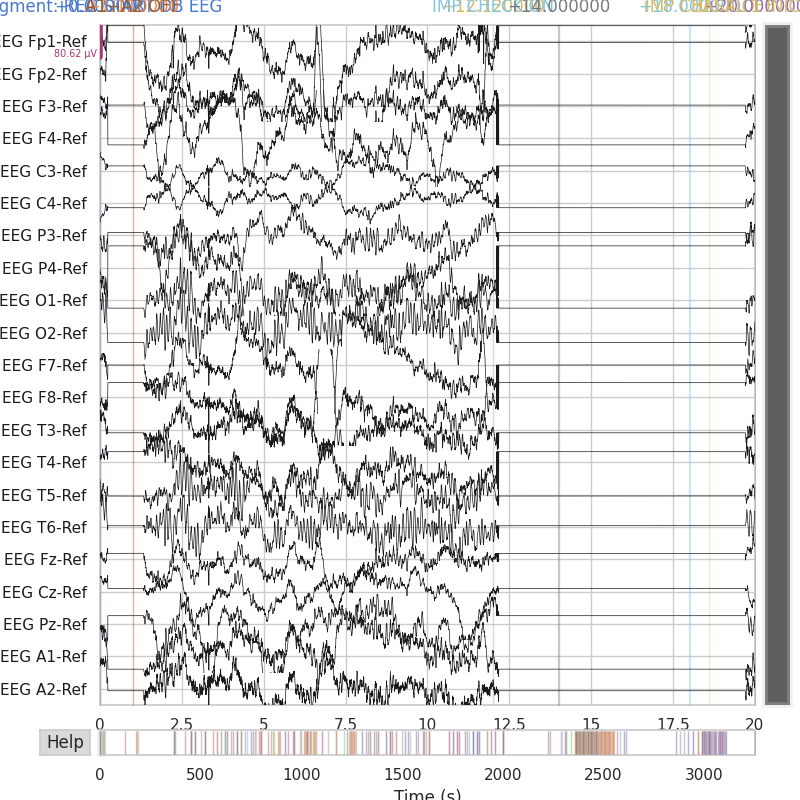

In [16]:
inspecionar_participante('control_14-sem marcacoes.edf') 

--- A inspecionar: control_35.edf ---
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_35.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 496799  =      0.000 ...  2483.995 secs...


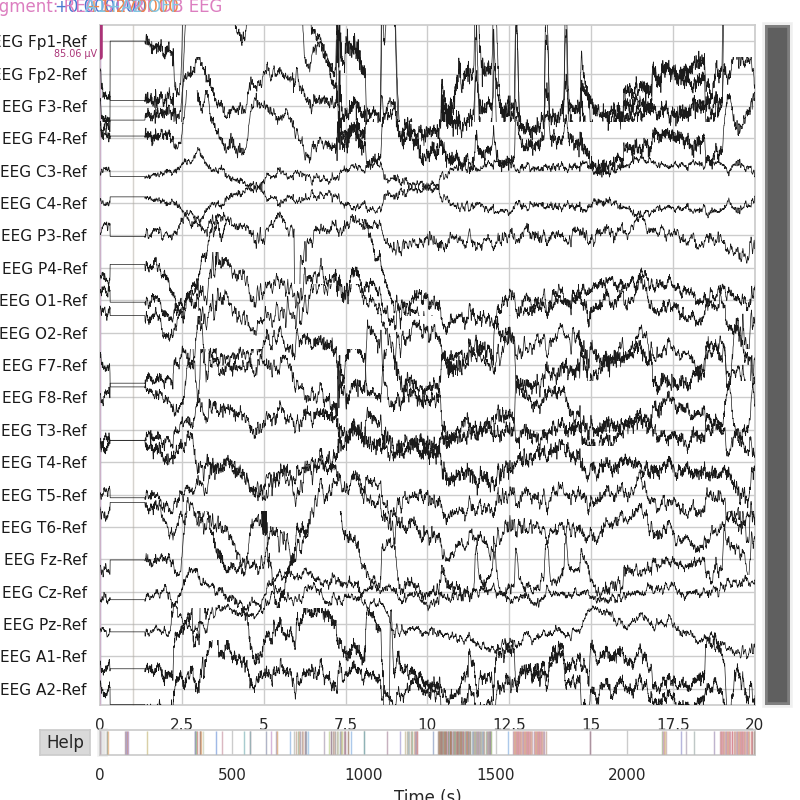

In [17]:
inspecionar_participante('control_35.edf') 

--- A inspecionar: TEA_G_28.edf ---
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/TEA_G_28.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 456399  =      0.000 ...  2281.995 secs...


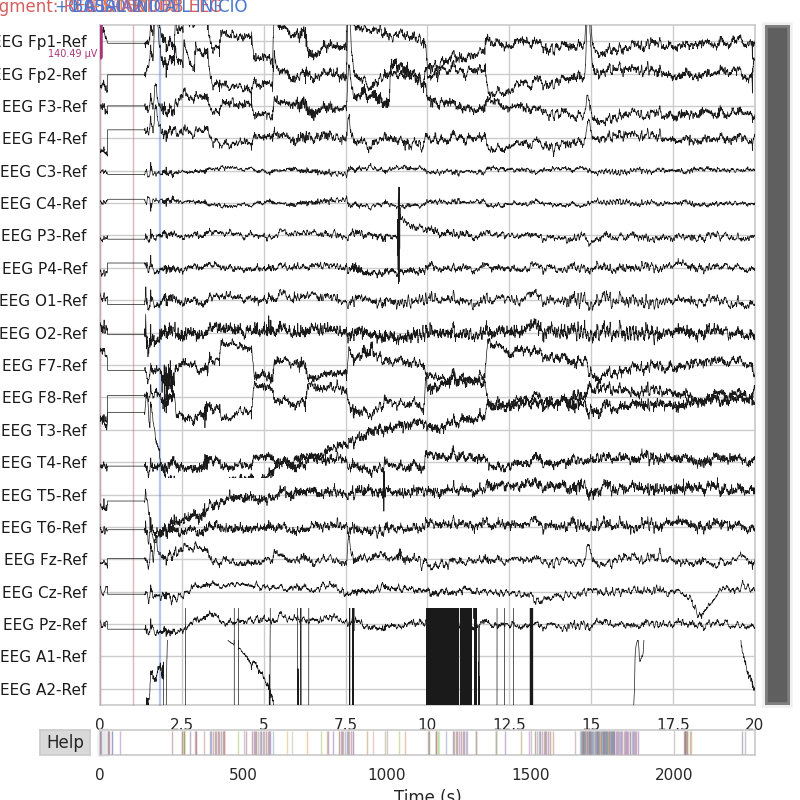

In [18]:
inspecionar_participante('TEA_G_28.edf')

--- A inspecionar: control_36.edf ---
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_36.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 432799  =      0.000 ...  2163.995 secs...


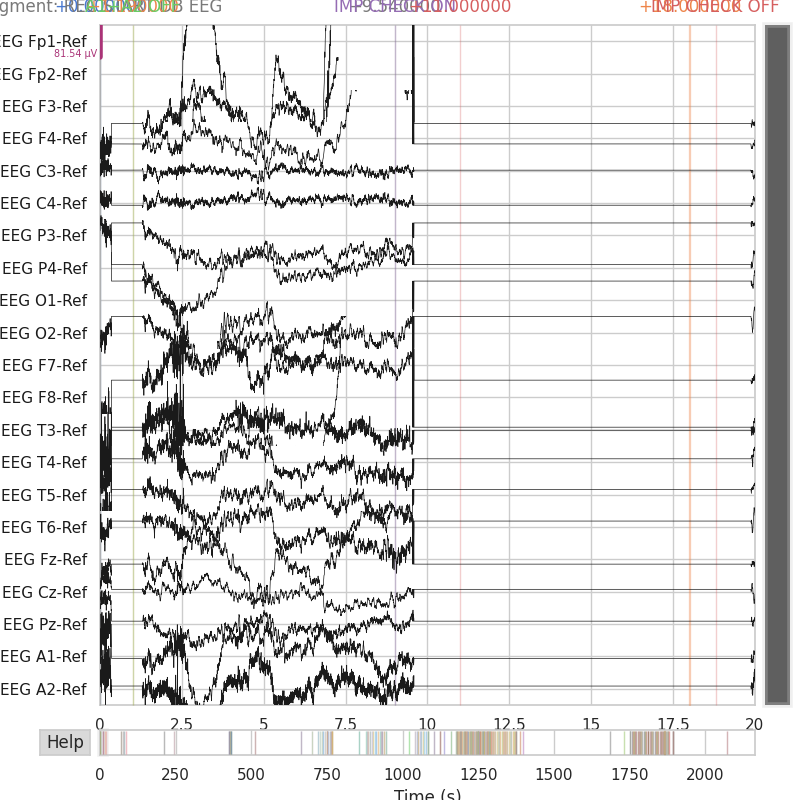

In [19]:
inspecionar_participante('control_36.edf') 

--- A inspecionar: control_37.edf ---
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_37.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 510599  =      0.000 ...  2552.995 secs...


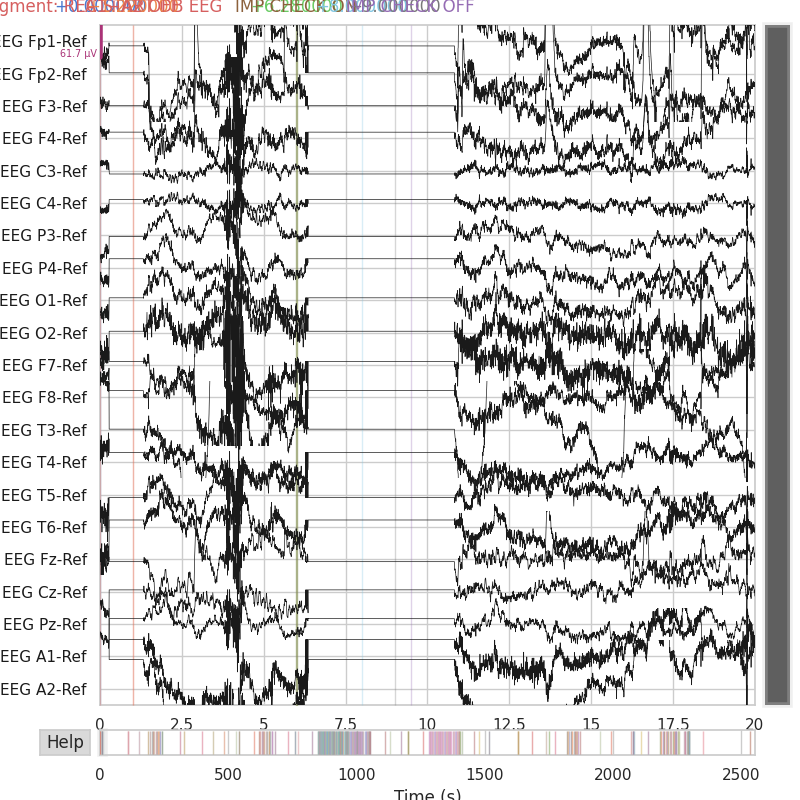

In [20]:
inspecionar_participante('control_37.edf') 

--- A inspecionar: control_38.edf ---
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_38.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1020399  =      0.000 ...  5101.995 secs...


/tmp/ipykernel_29803/3587602839.py:14: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_29803/3587602839.py:14: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


Using matplotlib as 2D backend.


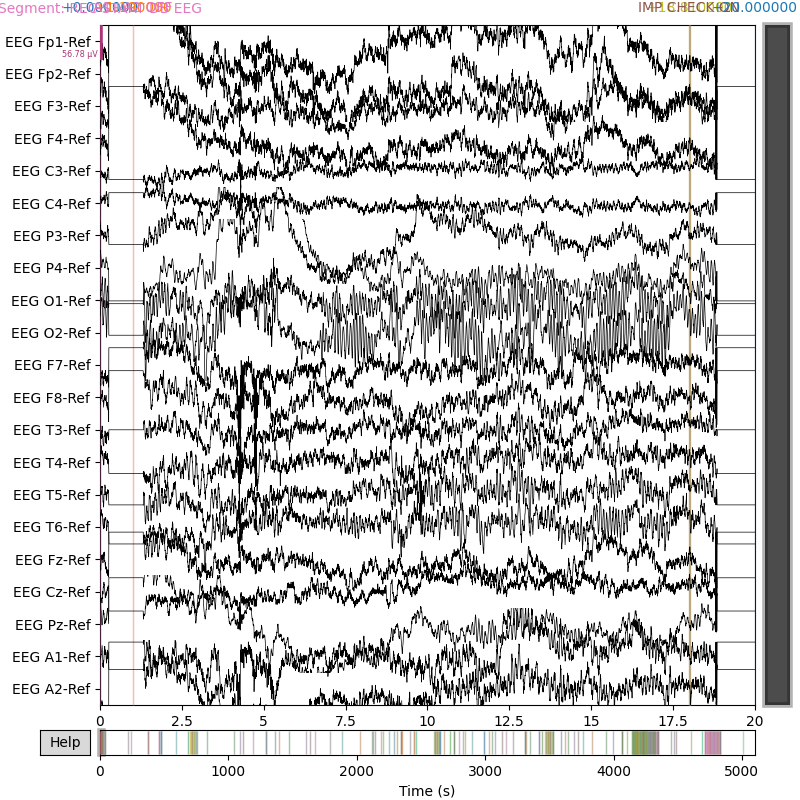

In [5]:
inspecionar_participante('control_38.edf') 

--- A inspecionar: control_39.edf ---
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_39.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 414599  =      0.000 ...  2072.995 secs...


/tmp/ipykernel_29803/3587602839.py:14: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_29803/3587602839.py:14: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


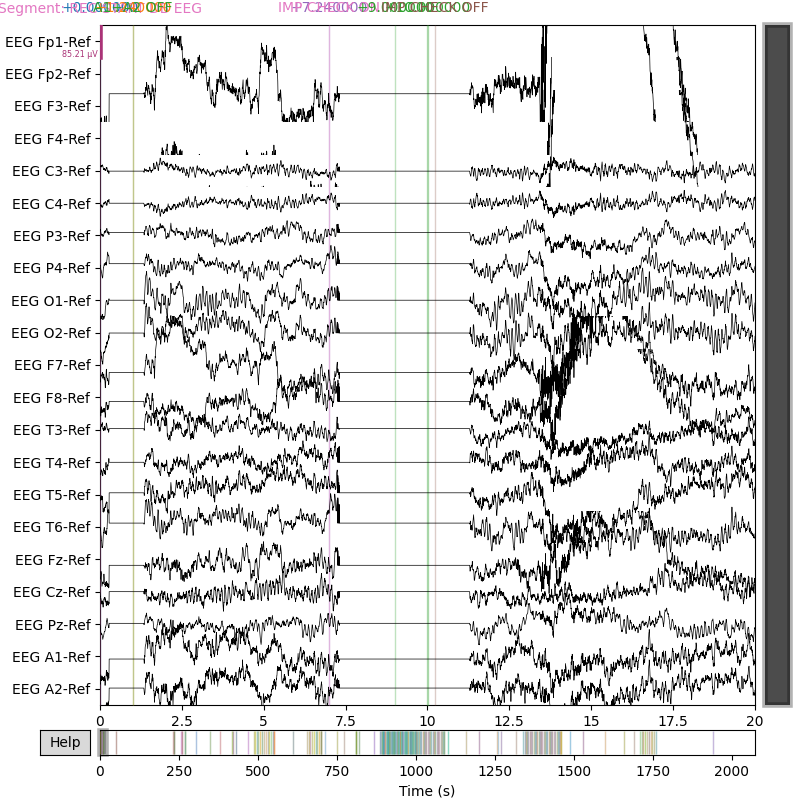

In [6]:
inspecionar_participante('control_39.edf') 

--- A inspecionar: control_41.edf ---
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_41.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 901999  =      0.000 ...  4509.995 secs...


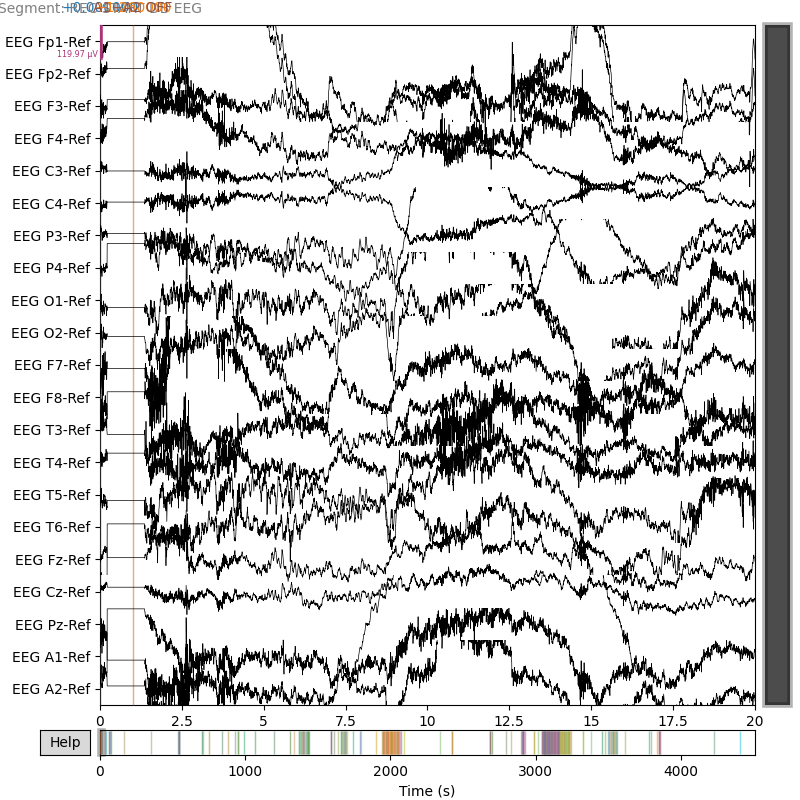

In [8]:
inspecionar_participante('control_41.edf') 

--- A inspecionar: control_42.edf ---
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_42.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 439599  =      0.000 ...  2197.995 secs...


/tmp/ipykernel_29803/3587602839.py:14: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_29803/3587602839.py:14: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


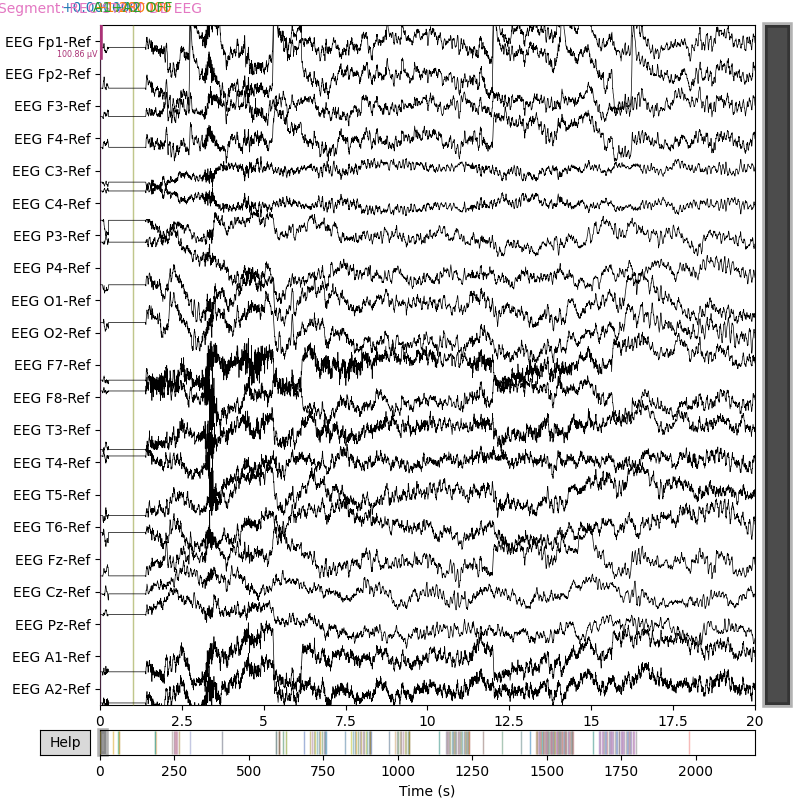

In [10]:
inspecionar_participante('control_42.edf') 

--- A inspecionar: control_43.edf ---
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_43.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 372199  =      0.000 ...  1860.995 secs...


/tmp/ipykernel_29803/3587602839.py:14: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_29803/3587602839.py:14: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


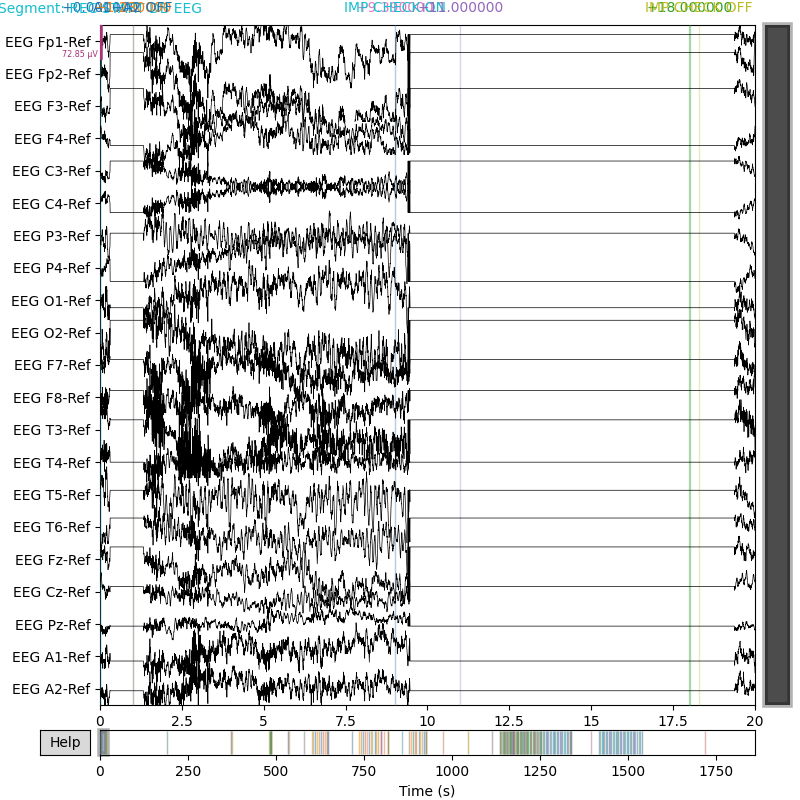

In [12]:
inspecionar_participante('control_43.edf') 

--- A inspecionar: control_44.edf ---
Extracting EDF parameters from /workspaces/EEG_Project/data/raw/control_44.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 402599  =      0.000 ...  2012.995 secs...


/tmp/ipykernel_29803/3587602839.py:14: RuntimeWarning: Scaling factor is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(
/tmp/ipykernel_29803/3587602839.py:14: RuntimeWarning: Physical range is not defined in following channels:
POL SpO2, POL EtCO2, POL Pulse, POL CO2Wave
  raw = mne.io.read_raw_edf(


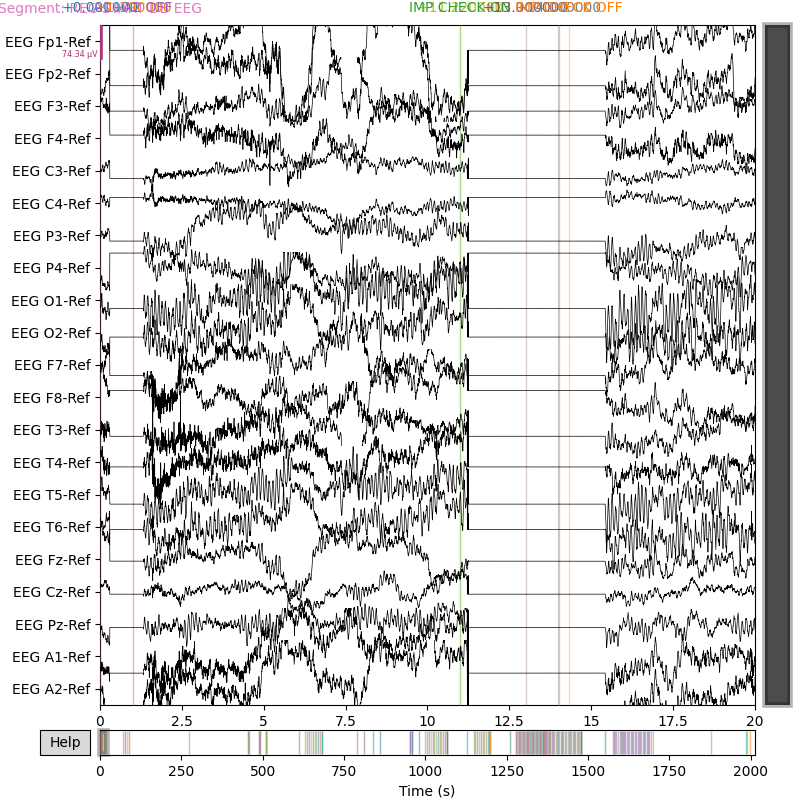

In [13]:
inspecionar_participante('control_44.edf') 